# Vehicle Tracking 
### Joseph Voyles

In [2]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import cv2
import glob
import time
%matplotlib inline
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler
from sklearn.cross_validation import train_test_split
from skimage.feature import hog
from mpl_toolkits.mplot3d import Axes3D
from scipy.ndimage.measurements import label
from moviepy.editor import VideoFileClip
import pickle
import os

/home/joseph/py3_kernel/lib/python3.5/site-packages/sklearn/cross_validation.py:44: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


### Image Feature Extraction Functions

In [3]:
# return image color features
def colorFeatures(img,color_space):
    if color_space != 'RGB':
        if color_space == 'HSV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    else: feature_image = np.copy(img)
        
    return feature_image
        
# returns a color histogram
def color_hist(img, nbins=32, bins_range=(0, 256)):
    # Compute the histogram of the color channels separately
    channel1_hist = np.histogram(img[:,:,0], bins=nbins, range=bins_range)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins, range=bins_range)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins, range=bins_range)
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return hist_features

# function bins the color features  
def bin_spatial(img, size=(32, 32)):
    features = cv2.resize(img, size).ravel() 
    # Return the feature vector
    return features


# create hog features for single image
def hogFeatures(img, orient, pix_per_cell, cell_per_block, vis=False, feature_vec=True):
    if vis == True:
        features, hog_image = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), transform_sqrt=False, 
                                  visualise=True, feature_vector=False)
        return features, hog_image
    else:      
        features = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), transform_sqrt=False, 
                       visualise=False, feature_vector=feature_vec)
    return features


### Helper Functions

In [4]:
# Extract features from a list of images
def extract_features(imgs, cspace='RGB', orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_size=(32, 32),hist_bins=32, hist_range=(0, 256)):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    for file in imgs:
        image_features = []
        # Read in each one by one
        img = mpimg.imread(file)
        
        # apply color conversion
        imageFeats = colorFeatures(img,cspace)

        spatial_features = bin_spatial(imageFeats, size=spatial_size)
        # Apply color_hist() also with a color space option now
        hist_features = color_hist(imageFeats, nbins=hist_bins, bins_range=hist_range)
        image_features.append(spatial_features)
        image_features.append(hist_features)
        # Call get_hog_features() with vis=False, feature_vec=True
        if hog_channel == 'ALL':
            hog_features = []
            for channel in range(imageFeats.shape[2]):
                hog_features.append(hogFeatures(imageFeats[:,:,channel], 
                                    orient, pix_per_cell, cell_per_block, 
                                    vis=False, feature_vec=True))
            hog_features = np.ravel(hog_features)        
        else:
            hog_features = hogFeatures(imageFeats[:,:,hog_channel], orient, 
                        pix_per_cell, cell_per_block, vis=False, feature_vec=True)
        
        image_features.append(hog_features)
        # Append the new feature vector to the features list
        features.append(np.concatenate(image_features))
    # Return list of feature vectors
    return features

In [5]:
# Define a function to return some characteristics of the dataset 
def data_look(car_list, notcar_list):
    data_dict = {}
    # Define a key in data_dict "n_cars" and store the number of car images
    data_dict["n_cars"] = len(car_list)
    # Define a key "n_notcars" and store the number of notcar images
    data_dict["n_notcars"] = len(notcar_list)
    # Read in a test image, either car or notcar
    example_img = mpimg.imread(car_list[0])
    # Define a key "image_shape" and store the test image shape 3-tuple
    data_dict["image_shape"] = example_img.shape
    # Define a key "data_type" and store the data type of the test image.
    data_dict["data_type"] = example_img.dtype
    # Return data_dict
    return data_dict

def plot3d(pixels, colors_rgb,
        axis_labels=list("RGB"), axis_limits=[(0, 255), (0, 255), (0, 255)]):
    """Plot pixels in 3D."""

    # Create figure and 3D axes
    fig = plt.figure(figsize=(8, 8))
    ax = Axes3D(fig)

    # Set axis limits
    ax.set_xlim(*axis_limits[0])
    ax.set_ylim(*axis_limits[1])
    ax.set_zlim(*axis_limits[2])

    # Set axis labels and sizes
    ax.tick_params(axis='both', which='major', labelsize=14, pad=8)
    ax.set_xlabel(axis_labels[0], fontsize=16, labelpad=16)
    ax.set_ylabel(axis_labels[1], fontsize=16, labelpad=16)
    ax.set_zlabel(axis_labels[2], fontsize=16, labelpad=16)

    # Plot pixel values with colors given in colors_rgb
    ax.scatter(
        pixels[:, :, 0].ravel(),
        pixels[:, :, 1].ravel(),
        pixels[:, :, 2].ravel(),
        c=colors_rgb.reshape((-1, 3)), edgecolors='none')

    return ax

In [6]:
# draw boxes around vehicles given box points
# used for testing
def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    # Make a copy of the image
    draw_img = np.copy(img)
    # Iterate through the bounding boxes
    for bbox in bboxes:
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(draw_img, bbox[0], bbox[1], color, thick)
    # Return the image copy with boxes drawn
    return draw_img

# function is used to slide windows through the image and returns a list of windows
def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None], 
                    xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    
    # If x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
        
    # Compute the span of the region to be searched    
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    
    # Compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    
    # Compute the number of windows in x/y
    nx_windows = np.int(xspan/nx_pix_per_step) #- 1
    ny_windows = np.int(yspan/ny_pix_per_step) #- 1
    # Initialize a list to append window positions to
    window_list = []
    
    # Loop through finding x and y window positions
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            # Calculate window position
            startx = xs*nx_pix_per_step + x_start_stop[0]
            endx = startx + xy_window[0]
            starty = ys*ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]
            # Append window position to list
            window_list.append(((startx, starty), (endx, endy)))
    # Return the list of windows
    return window_list

# creates features for a single image. Same as extract features but for single image instead of list 
def single_img_features(img, color_space='LUV', 
                            spatial_size=(16, 16), hist_bins=64, 
                            orient=9, pix_per_cell=8, 
                            cell_per_block=2, 
                            hog_channel=0, spatial_feat=True, 
                            hist_feat=True, hog_feat=True, hist_range=(0, 256)):

    image_features = []

    # apply color conversion
    imageFeats = colorFeatures(img,color_space)
    #imageFeats = np.copy(img)
    spatial_features = bin_spatial(imageFeats, size=spatial_size)
    # Apply color_hist() also with a color space option now
    hist_features = color_hist(imageFeats, nbins=hist_bins, bins_range=hist_range)
    
    image_features.append(spatial_features)
    image_features.append(hist_features)
    # Call get_hog_features() with vis=False, feature_vec=True
    if hog_channel == 'ALL':
        hog_features = []
        for channel in range(imageFeats.shape[2]):
            hog_features.append(hogFeatures(imageFeats[:,:,channel], 
                                orient, pix_per_cell, cell_per_block, 
                                vis=False, feature_vec=True))
        hog_features = np.ravel(hog_features)        
    else:
        hog_features = hogFeatures(imageFeats[:,:,hog_channel], orient, 
                    pix_per_cell, cell_per_block, vis=False, feature_vec=True)

    image_features.append(hog_features)
   
    # Return list of feature vectors
    return  np.concatenate(image_features)

def apply_threshold(heatmap, threshold):
    # if  pixels do not meet threshold, reset to 0
    heatmap[heatmap <= threshold] = 0
    # return the heatmape
    return heatmap

# function creates a heatmap for regions where vehicle has been detected
def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        
        # where vehicles have been detected, increment piel values
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Retnurn updated heatmap
    return heatmap

# function draws bounding boxes around each image
def draw_labeled_bboxes(img, labels):
    # loop through the detected cars
    boxes = []
    for car_number in range(1, labels[1]+1):
        # grab the pixels where vehicle has been identified
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # create a bounding box using min and max coordinates for pixels with a detected vehicle
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
        boxes.append(bbox)
    # Return the image
    return img,boxes

# function masks a portion of the image
# window sizes restrict search, but masking provides a little wiggle room in binding the region of interest and
# providing full coverage by defined windows
def region_of_interest(img, vertices):
    #defining a blank mask to start with
    mask = np.zeros_like(img[:,:,0])   
    ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_imageR = cv2.bitwise_and(img[:,:,0], mask)
    
    #defining a blank mask to start with
    mask = np.zeros_like(img[:,:,1])   
    ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_imageG = cv2.bitwise_and(img[:,:,1], mask)
    
    #defining a blank mask to start with
    mask = np.zeros_like(img[:,:,2])   
    ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_imageB = cv2.bitwise_and(img[:,:,2], mask)
    
    ret = concat_channels(masked_imageR,masked_imageG,masked_imageB)
    
    return ret

# function for concatenating the image channels after they have been masedk
# Source for code: https://wjngkoh.wordpress.com/2015/01/29/numpy-concatenate-three-images-rgb-into-one/
def concat_channels(r, g, b):
    assert r.ndim == 2 and g.ndim == 2 and b.ndim == 2
    rgb = (r[..., np.newaxis], g[..., np.newaxis], b[..., np.newaxis])
    return np.concatenate(rgb, axis=-1)

# function for searching windows that are extracted from images
def search_windows(img, windows, clf, scaler, color_space='LUV', 
                    spatial_size=(16,16), hist_bins=64, 
                    hist_range=(0, 256), orient=9, 
                    pix_per_cell=8, cell_per_block=2, 
                    hog_channel=0, spatial_feat=True, 
                    hist_feat=True, hog_feat=True):

    # list to hold the windows
    on_windows = []
    # iterate over the extracted windows
    for window in windows:
        
        # resize the image, extract features, normalize and classify
        test_img = cv2.resize(img[window[0][1]:window[1][1], window[0][0]:window[1][0]], (64, 64))      
        features = single_img_features(test_img, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)
       
        
        win_features = scaler.transform(features)
        # predict using trained model
        prediction = clf.predict(win_features)
        # only keep windows with a positive vehicle detection
        if prediction == 1:
            on_windows.append(window)
    # return windows where vehicle is present
    return on_windows

### Feature Exploration

In [7]:
#read the test images
imageDir = "test_images/"
files = os.listdir(imageDir)

In [8]:
# read the images
veh = glob.glob('vehicles_IMG/*/*.png')
nonVeh = glob.glob('non-vehicles_IMG/*/*.png')

# get information over the entire data set
imageData = data_look(veh,nonVeh)
print(imageData)

{'data_type': dtype('float32'), 'n_cars': 8792, 'n_notcars': 8968, 'image_shape': (64, 64, 3)}


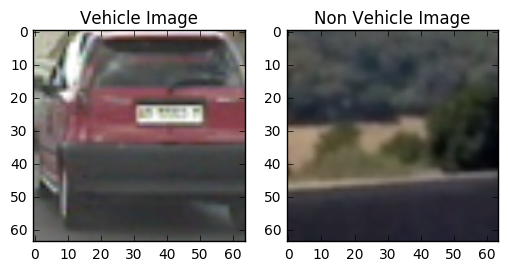

In [195]:
vehImg = mpimg.imread(veh[32])
vehNonImg = mpimg.imread(nonVeh[0])
# Plot the examples
fig = plt.figure()
plt.subplot(121)
plt.imshow(vehImg)
plt.title('Vehicle Image')
plt.subplot(122)
plt.imshow(vehNonImg)
plt.title('Non Vehicle Image')

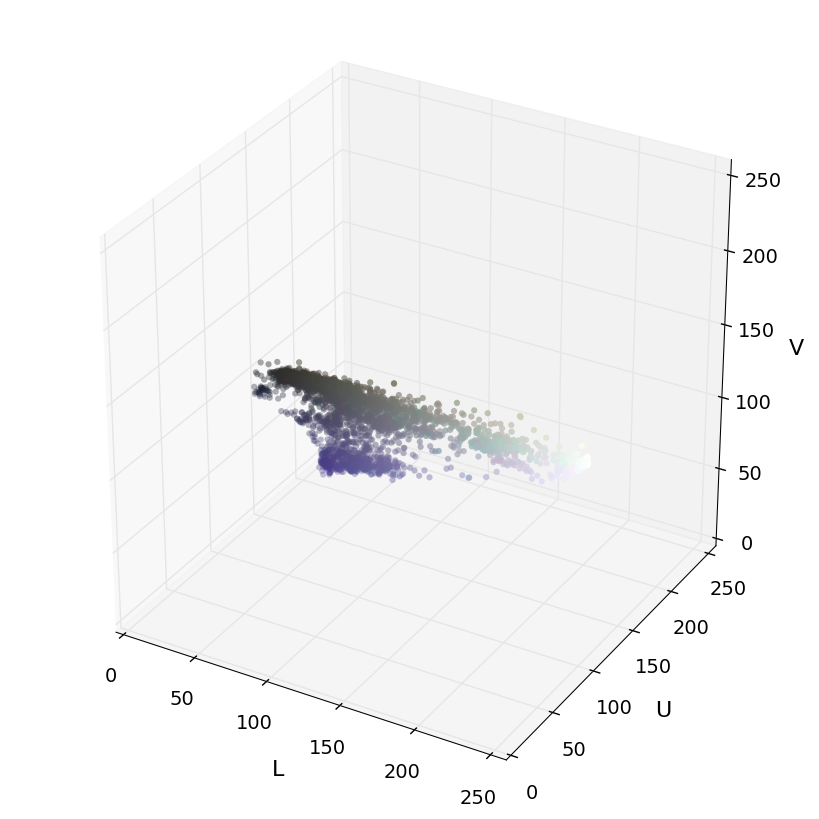

In [212]:
# Select a small fraction of pixels to plot by subsampling it
vehImg = cv2.imread(veh[32])
scale = max(vehImg.shape[0], vehImg.shape[1], 64) / 64  # at most 64 rows and columns
img_small = cv2.resize(vehImg, (np.int(vehImg.shape[1] / scale), np.int(vehImg.shape[0] / scale)), interpolation=cv2.INTER_NEAREST)
# extract color features

colorSpace = colorFeatures(img_small,'LUV')
img_small_rgb = colorFeatures(img_small,'RGB')/255.
plot3d(colorSpace, img_small_rgb, axis_labels=list("LUV"))
plt.show()

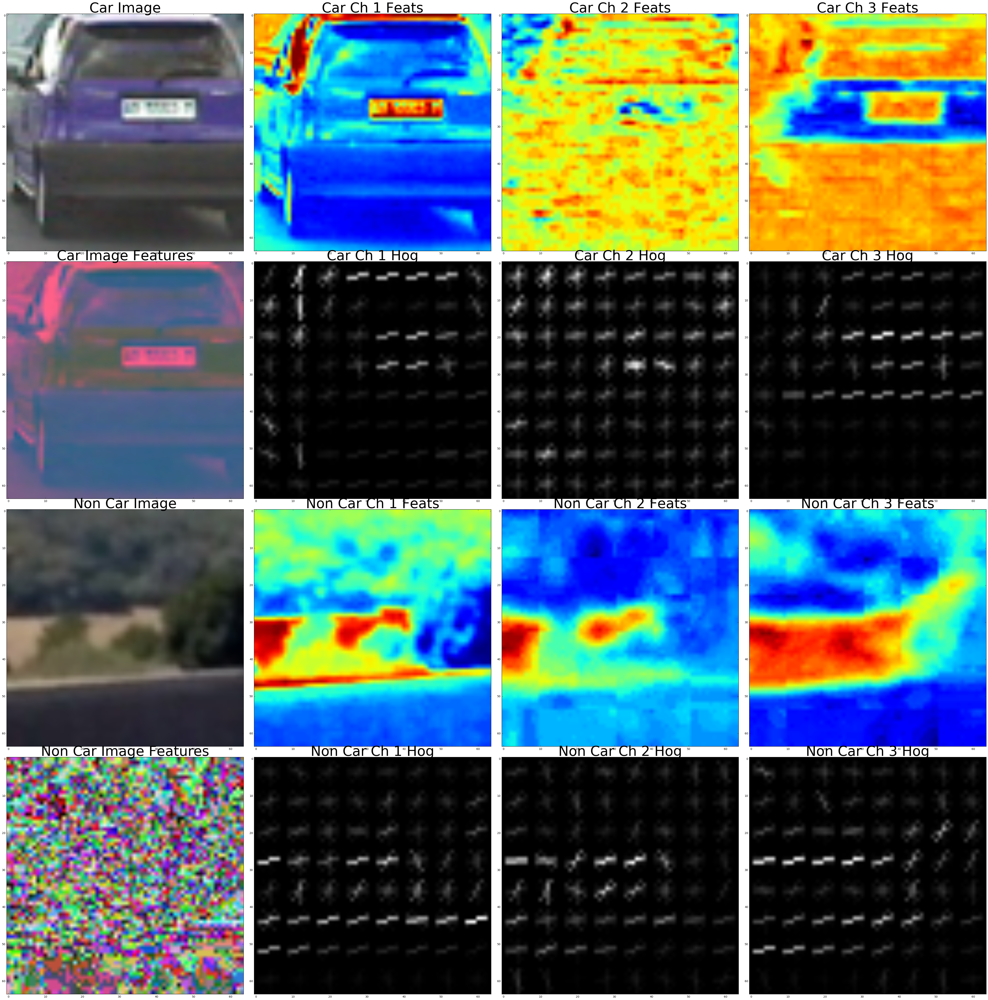

In [233]:
# extract hog features
colorFeatsC = colorFeatures(vehImg,color_space='LUV')
colorFeatsNC = colorFeatures(vehNonImg,color_space='LUV')
# Define HOG parameters
orient = 9
pix_per_cell = 8
cell_per_block = 2
hog_channel = 2
# Call our function with vis=True to see an image output
features,hogCCh1 = hogFeatures(colorFeatsC[:,:,0], orient, 
                        pix_per_cell, cell_per_block,
                        vis=True, feature_vec=False)
# Call our function with vis=True to see an image output
features,hogCCh2 = hogFeatures(colorFeatsC[:,:,1], orient, 
                        pix_per_cell, cell_per_block,
                        vis=True, feature_vec=False)
# Call our function with vis=True to see an image output
features,hogCCh3 = hogFeatures(colorFeatsC[:,:,2], orient, 
                        pix_per_cell, cell_per_block,
                        vis=True, feature_vec=False)


# Call our function with vis=True to see an image output
features,hognCCh1 = hogFeatures(colorFeatsNC[:,:,0], orient, 
                        pix_per_cell, cell_per_block,
                        vis=True, feature_vec=False)
# Call our function with vis=True to see an image output
features,hognCCh2 = hogFeatures(colorFeatsNC[:,:,1], orient, 
                        pix_per_cell, cell_per_block,
                        vis=True, feature_vec=False)
# Call our function with vis=True to see an image output
features,hognCCh3 = hogFeatures(colorFeatsNC[:,:,2], orient, 
                        pix_per_cell, cell_per_block,
                        vis=True, feature_vec=False)

# Plot the examples
#fig = plt.figure()
#plt.subplot(121)
#plt.imshow(vehImg)
#plt.title('Example Car Image')
#plt.subplot(122)
#colorFeats[:,:,hog_channel]
#plt.imshow(features, cmap='gray')
#plt.title('HOG Visualization')


f, ((ax1,ax2,ax3,ax4),(ax5,ax6,ax7,ax8),(ax9,ax10,ax11,ax12),(ax13,ax14,ax15,ax16)) = plt.subplots(4,4,figsize=(50, 50))
f.tight_layout()


ax1.imshow(vehImg)
ax1.set_title("Car Image",fontsize=50)
ax2.imshow(colorFeatsC[:,:,0])
ax2.set_title("Car Ch 1 Feats",fontsize=50)
ax3.imshow(colorFeatsC[:,:,1])
ax3.set_title("Car Ch 2 Feats",fontsize=50)
ax4.imshow(colorFeatsC[:,:,2])
ax4.set_title("Car Ch 3 Feats",fontsize=50)


ax5.imshow(colorFeatsC)
ax5.set_title("Car Image Features",fontsize=50)
ax6.imshow(hogCCh1,cmap='gray')
ax6.set_title("Car Ch 1 Hog",fontsize=50)
ax7.imshow(hogCCh2,cmap='gray')
ax7.set_title("Car Ch 2 Hog",fontsize=50)
ax8.imshow(hogCCh3,cmap='gray')
ax8.set_title("Car Ch 3 Hog",fontsize=50)


ax9.imshow(vehNonImg)
ax9.set_title("Non Car Image",fontsize=50)
ax10.imshow(colorFeatsNC[:,:,0])
ax10.set_title("Non Car Ch 1 Feats",fontsize=50)
ax11.imshow(colorFeatsNC[:,:,1])
ax11.set_title("Non Car Ch 2 Feats",fontsize=50)
ax12.imshow(colorFeatsNC[:,:,2])
ax12.set_title("Non Car Ch 3 Feats",fontsize=50)


ax13.imshow(colorFeatsNC)
ax13.set_title("Non Car Image Features",fontsize=50)
ax14.imshow(hognCCh1,cmap='gray')
ax14.set_title("Non Car Ch 1 Hog",fontsize=50)
ax15.imshow(hognCCh2,cmap='gray')
ax15.set_title("Non Car Ch 2 Hog",fontsize=50)
ax16.imshow(hognCCh3,cmap='gray')
ax16.set_title("Non Car Ch 3 Hog",fontsize=50)


### Prepare Data Set

In [178]:
# read in the manually prepared train and test data
vehTrain = glob.glob('vehicles/vehicles/trainVeh/*/*.png')
vehTest= glob.glob('vehicles/vehicles/testVeh/*/*.png')
nonVehTrain= glob.glob('non-vehicles_IMG/GTI/*/*.png')
nonVehTest= glob.glob('non-vehicles_IMG/test/*.png')

# validate sizes for test and train data set
print("NonVehTest: "+str(len(nonVehTest)))
print("NonVehTrain: "+str(len(nonVehTrain)))
print("VehTest: "+str(len(vehTest)))
print("VehTrain: "+str(len(vehTrain)))

NonVehTest: 2531
NonVehTrain: 0
VehTest: 2597
VehTrain: 6195


### Train Classifier

In [27]:
# create features for the train and test data set  
spatial = 16
histbin = 64
colorspace = 'LUV' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9
pix_per_cell = 8
cell_per_block = 2
hog_channel = 0

veh_features_train = extract_features(vehTrain, cspace=colorspace, spatial_size=(spatial, spatial),
                        hist_bins=histbin, hist_range=(0, 256),hog_channel=hog_channel)
veh_features_test = extract_features(vehTest, cspace=colorspace, spatial_size=(spatial, spatial),
                        hist_bins=histbin, hist_range=(0, 256),hog_channel=hog_channel)
nonVeh_features_train = extract_features(nonVehTrain, cspace=colorspace, spatial_size=(spatial, spatial),
                        hist_bins=histbin, hist_range=(0, 256),hog_channel=hog_channel)
nonVeh_features_test = extract_features(nonVehTest, cspace=colorspace, spatial_size=(spatial, spatial),
                        hist_bins=histbin, hist_range=(0, 256),hog_channel=hog_channel)

# stack all features
X = np.vstack((veh_features_train,nonVeh_features_train,veh_features_test, nonVeh_features_test)).astype(np.float64)                        
# fit normalization to the features
X_scaler = StandardScaler().fit(X)
# apply normalization to the features
scaled_X = X_scaler.transform(X)

In [28]:
# save the normalization model to disk
filename = 'scaler.sav'
pickle.dump(X_scaler, open(filename, 'wb'))

In [29]:
# Define the labels vector for the training and test data
y = np.hstack((np.ones(len(veh_features_train)),
               np.zeros(len(nonVeh_features_train)),np.ones(len(veh_features_test)),np.zeros(len(nonVeh_features_test))))

In [30]:
# isolate the training and test sets for the features and labels
x_Train = scaled_X[:len(vehTrain)+len(nonVehTrain)]
x_Test = scaled_X[len(vehTrain)+len(nonVehTrain):]
y_Train = y[:len(vehTrain)+len(nonVehTrain)]
y_Test = y[len(vehTrain)+len(nonVehTrain):]

In [180]:
# Validate the train test split sizes
print("X Train Size: ")
print(len(x_Train))
print("X Test Size: ")
print(len(x_Test))
print("Y Train Size: ")
print(len(y_Train))
print("Y Test Size: ")
print(len(y_Test))

X Train Size: 
12632
X Test Size: 
5128
Y Train Size: 
12632
Y Test Size: 
5128


In [32]:
# fit a linear SVC
svc = LinearSVC()
svc.fit(x_Train, y_Train)

# Check the score of the SVC
print('Test Accuracy of SVC = ', round(svc.score(x_Test, y_Test), 4))

# save the model to disk
filename = 'finalized_model.sav'
pickle.dump(svc, open(filename, 'wb'))

Test Accuracy of SVC =  0.9762
My SVC predicts:  [ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.]
For these 10 labels:  [ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.]


### Tune the Image Search

In [ ]:
newIMG = mpimg.imread(imageDir+files[0])
test = single_img_features(newIMG)

#### Explore windows sizes and region of interest

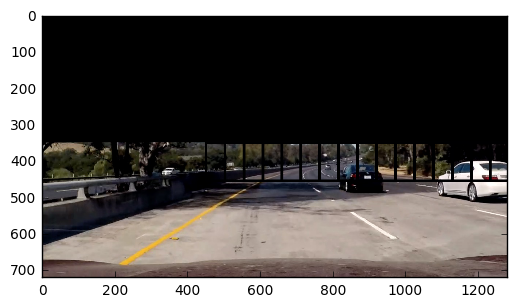

In [182]:
frameExtracDir = "videoExtract"
frames = os.listdir(frameExtracDir)
newIMG = mpimg.imread(imageDir+files[0])
#newIMG = mpimg.imread(frameExtracDir+frames[0])

# define vertices for masking images
vert = np.array([[(0,720),(0,350),(1280,350),(1280,720)]], dtype=np.int32)

# create a masked image
image = region_of_interest(newIMG,vert)

# correct image values
image = image.astype(np.float32)/255

# test different window sizes
windowSize = (105,105)
xStartStop =[450, 1280]
yStartStop = [350,450]
overlap = (.5,.5)


box = slide_window(image,x_start_stop=xStartStop, y_start_stop=yStartStop, 
                    xy_window=(105,105), xy_overlap=overlap)
plt.imshow(draw_boxes(image,box))


#### Test Window Sizes

In [44]:
frameExtracDir = "videoExtract"
frames = os.listdir(frameExtracDir)
newIMG = mpimg.imread(imageDir+files[3])
#newIMG = mpimg.imread(frameExtracDir+frames[0])

# load the normalization model from disk
filename = 'scaler.sav'
X_scaler = pickle.load(open(filename, 'rb'))

# load the SVC model from disk
filename = 'finalized_model.sav'
svc = pickle.load(open(filename, 'rb'))

# mask the image
vert = np.array([[(0,720),(0,350),(1280,350),(1280,720)]], dtype=np.int32)
image = region_of_interest(newIMG,vert)

# transform opened image
image = image.astype(np.float32)/255

# define box sizes and regions of interest
box_size = [(90,90),(100,100),(100,100),(105,105),(150,150),(280,280)]
x_startStop = [[460,image.shape[1]],[460,image.shape[1]],[460,image.shape[1]],[450,image.shape[1]],
               [400,image.shape[1]],[400,image.shape[1]]]
y_startStop = [[350,450],[350,450],[350,450],[350,450],[400,720],[400,720]]

foundCars2 = []

# Loop through the box sizes 
for i in range(0,len(box_size)):
    box += slide_window(image,x_start_stop=x_startStop[i], y_start_stop=y_startStop[i], 
                    xy_window=box_size[i], xy_overlap=(0.55,0.55))
    foundCars2.append(search_windows(image,box,svc,X_scaler))

In [31]:
# used for testing
def draw_boxes_cars(img, bboxes, color=(0, 0, 255), thick=6):
    # Make a copy of the image
    draw_img = np.copy(img)
    # Iterate through the bounding boxes
    for w in bboxes:
        for bbox in w:
            # Draw a rectangle given bbox coordinates
            cv2.rectangle(draw_img, bbox[0], bbox[1], color, thick)
        # Return the image copy with boxes drawn
    return draw_img

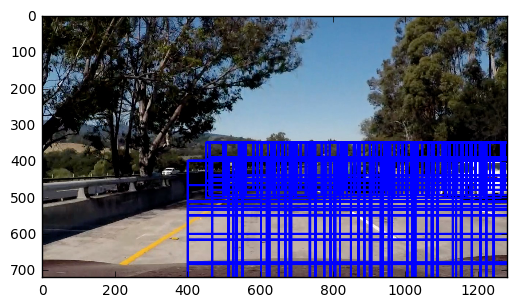

In [22]:
frameExtracDir = "videoExtract"
frames = os.listdir(frameExtracDir)
newIMG = mpimg.imread(imageDir+files[0])
plt.imshow(draw_boxes(newIMG,box))

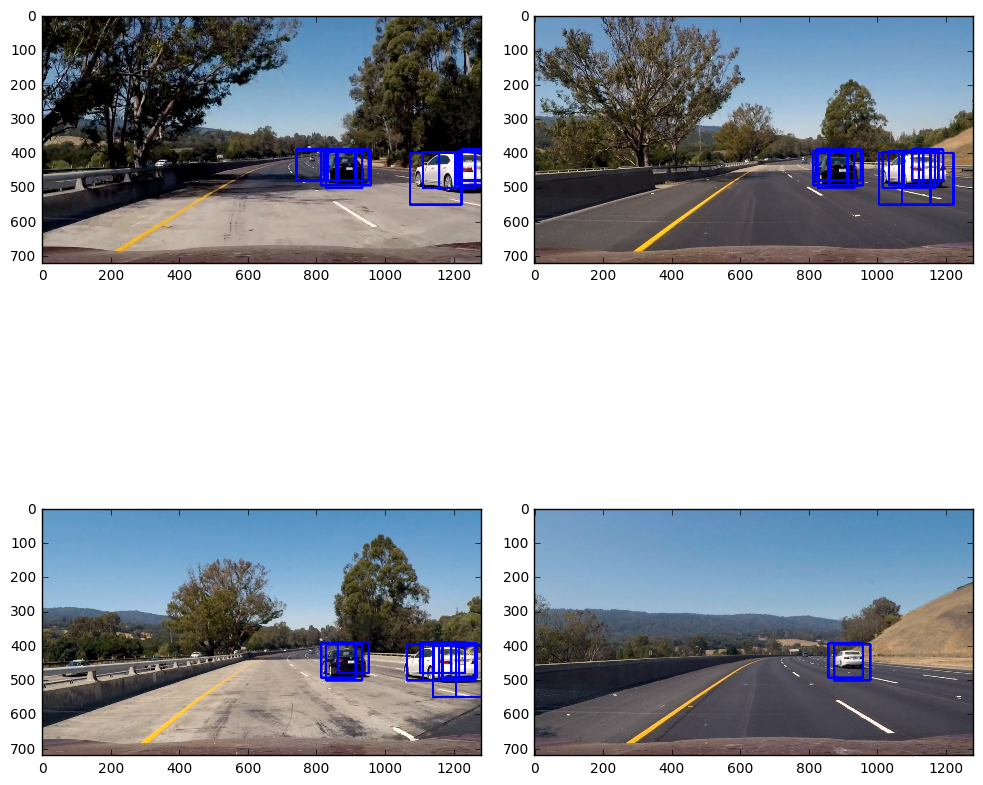

In [49]:
IMG_1 = mpimg.imread(imageDir+files[0])
IMG1Box = draw_boxes_cars(IMG_1,foundCars)

IMG_2 = mpimg.imread(imageDir+files[2])
IMG2Box= draw_boxes_cars(IMG_2,foundCars1)

IMG_3 = mpimg.imread(imageDir+files[3])
IMG3Box = draw_boxes_cars(IMG_3 ,foundCars2)

IMG_4 = mpimg.imread(imageDir+files[4])
IMG4Box = draw_boxes_cars(IMG_4,foundCars3)


f, ((ax1,ax2),(ax3,ax4)) = plt.subplots(2,2,figsize=(10, 10))
f.tight_layout()


ax1.imshow(IMG1Box)

ax2.imshow(IMG2Box)

ax3.imshow(IMG3Box)

ax4.imshow(IMG4Box)


In [ ]:
heat = np.zeros_like(newIMG[:,:,0]).astype(np.float)

# loop through the cars and apply heat
for f in foundCars:
    heat = add_heat(heat,f)
    
# Apply threshold to help remove false positives
heat = apply_threshold(heat,1)

# Visualize the heatmap when displaying    
heatmap = np.clip(heat, 0, 255)

# Find final boxes from heatmap using label function
labels = label(heatmap)


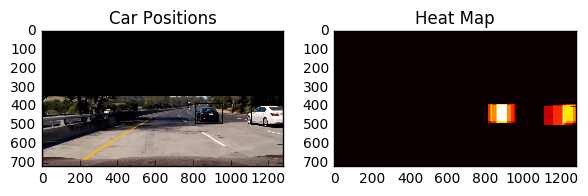

In [186]:
# plot the heatmap
draw_img,box = draw_labeled_bboxes(np.copy(image), labels)

fig = plt.figure()
plt.subplot(121)
plt.imshow(draw_img)
plt.title('Car Positions')
plt.subplot(122)
plt.imshow(heatmap, cmap='hot')
plt.title('Heat Map')
fig.tight_layout()

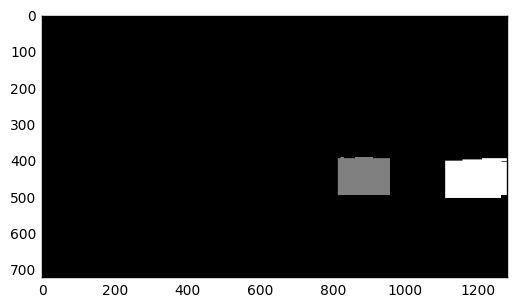

In [187]:
# Plot the labels
plt.imshow(labels[0], cmap='gray')

### Processing Pipeline

In [82]:
# function used to perform a vehicle search for each frame
def processImage(image):
    
    #vert = np.array([[(0,720),(0,350),(1280,350),(1280,720)]], dtype=np.int32)
    #plt.imshow(newIMG)

    #image = region_of_interest(image,vert)
    #plt.imshow(image)
    
    image = image.astype(np.float32)/255
    # create an image copy to hold the heat
    heat = np.zeros_like(image[:,:,0]).astype(np.float)


    box_size = [(90,90),(100,100),(100,100),(105,105),(150,150),(280,280)]
    x_startStop = [[460,image.shape[1]],[460,image.shape[1]],[460,image.shape[1]],[450,image.shape[1]],
                   [400,image.shape[1]],[400,image.shape[1]]]
    y_startStop = [[350,450],[350,450],[350,450],[350,450],[400,720],[400,720]]
    foundCars = []
    
    # loop through all of the box sizes and search the windows
    for i in range(0,len(box_size)):
        box = slide_window(image,x_start_stop=x_startStop[i], y_start_stop=y_startStop[i], 
                        xy_window=box_size[i], xy_overlap=(0.55,0.55))
        foundCars.append(search_windows(image,box,svc,X_scaler))
    
    for f in foundCars:
        heat = add_heat(heat,f)

    
    # Remove false positives for individual frames
    heat = apply_threshold(heat,1)

    return heat, foundCars

# function used to process each frame
def processFrame(img):
    global lastHeat
    currentHeat,cars = processImage(img)
   
    # check list to see if enough data is present to calculate moving average and filter false +
    if len(lastHeat) >=4:
        labels = label(currentHeat)
        lastHeat.append(currentHeat)
        getHeat = np.zeros_like(lastHeat[0])
        newHeat = np.zeros_like(lastHeat[0])
        for l in lastHeat:
            newHeat = np.add(newHeat,l)
        
        getHeat = apply_threshold(newHeat/3,1)
        newlabels = label(getHeat)
        # update the tracker with the latest 5 frames
        lastHeat = [lastHeat[-1],lastHeat[-2],lastHeat[-3],lastHeat[-4],lastHeat[-5]] 
            
    else:
        # Find final boxes from heatmap using label function
        lastHeat.append(currentHeat)
        newlabels = label(currentHeat)
    # draw bounding boxes around the found images 
    draw_img,boxes = draw_labeled_bboxes(np.copy(img), newlabels)
    return draw_img,newlabels

#### Test the pipeline

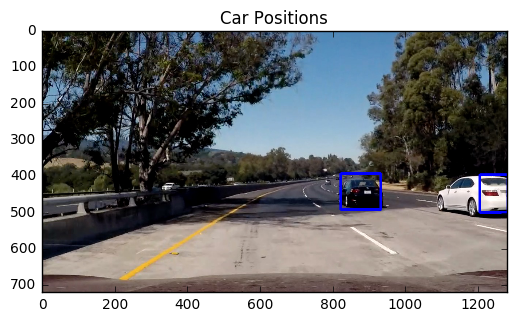

In [193]:
newIMG = mpimg.imread(imageDir+files[0])
#newIMG = newIMG.astype(np.float32)/255
boxes = processFrame(newIMG)
plt.imshow(boxes)
plt.title('Car Positions')

### Process the Video

In [159]:
# load the normalization model from disk
filename = 'scaler.sav'
X_scaler = pickle.load(open(filename, 'rb'))

# load the SVC model from disk
filename = 'finalized_model.sav'
svc = pickle.load(open(filename, 'rb'))

lastHeat = []
clip1 = VideoFileClip("project_video.mp4")
video_output = 'testVideo_out2.mp4'
white_clip = clip1.fl_image(processFrame)

%time white_clip.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video testVideo_out2.mp4
[MoviePy] Writing video testVideo_out2.mp4


100%|█████████▉| 1260/1261 [15:47<00:00,  1.37it/s]    | 1/1261 [00:01<22:23,  1.07s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: testVideo_out2.mp4 

CPU times: user 15min 39s, sys: 3.73 s, total: 15min 43s
Wall time: 15min 49s


### Extract Sample Frames for Testing

In [61]:
myclip.save_frame("videoExtract/frame5.jpeg", t='00:00:37.16',) # frame at time t=1h

In [ ]:
myclip = VideoFileClip("project_video.mp4")

In [62]:
frames = os.listdir("videoExtract/")

In [92]:
lastHeat = []
foundCars = []
for f in frames:
    newImg = mpimg.imread("videoExtract/"+f)
    heat,found = processImage(newIMG)
    lastHeat.append(heat)
    foundCars.append(found)
    # process the frames
    

In [93]:
foundCarImg = []
count = 0
for f in frames:
    newImg = mpimg.imread("videoExtract/"+f)
    foundCarImg.append(draw_boxes_cars(newIMG,foundCars[count]))
    count+=1

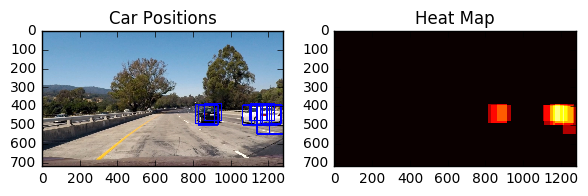

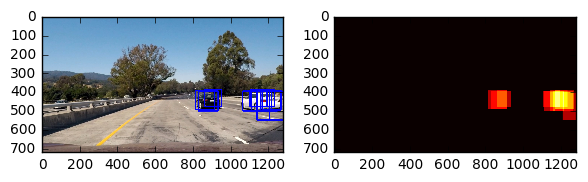

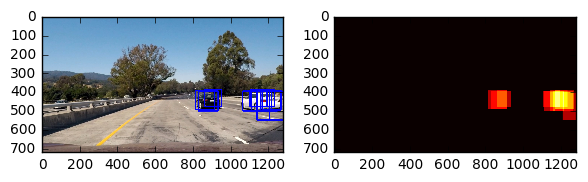

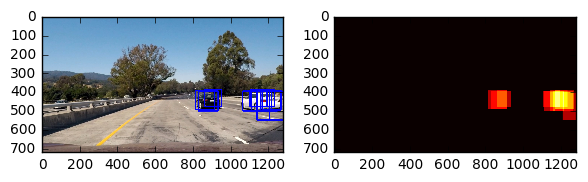

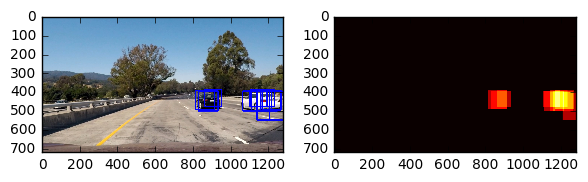

In [94]:
fig = plt.figure()
plt.subplot(121)
plt.imshow(foundCarImg[0])
plt.title('Car Positions')
plt.subplot(122)
plt.imshow(lastHeat[0], cmap='hot')
plt.title('Heat Map')
fig.tight_layout()

fig2 = plt.figure()
plt.subplot(121)
plt.imshow(foundCarImg[1])
plt.subplot(122)
plt.imshow(lastHeat[1], cmap='hot')
fig2.tight_layout()

fig3 = plt.figure()
plt.subplot(121)
plt.imshow(foundCarImg[2])
plt.subplot(122)
plt.imshow(lastHeat[2], cmap='hot')
fig3.tight_layout()

fig4 = plt.figure()
plt.subplot(121)
plt.imshow(foundCarImg[3])
plt.subplot(122)
plt.imshow(lastHeat[3], cmap='hot')
fig4.tight_layout()

fig5 = plt.figure()
plt.subplot(121)
plt.imshow(foundCarImg[1])
plt.subplot(122)
plt.imshow(lastHeat[4], cmap='hot')
fig5.tight_layout()


In [95]:
t = lastHeat[-1]

In [96]:
newImg = mpimg.imread("videoExtract/"+frames[4])
img,lab = processFrame(newImg)

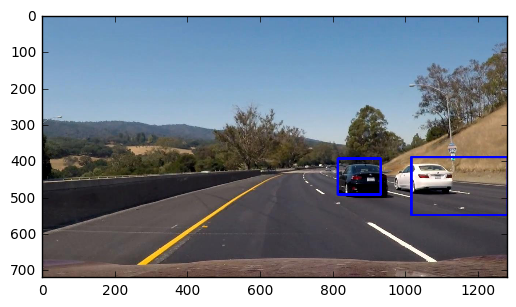

In [97]:
plt.imshow(img)

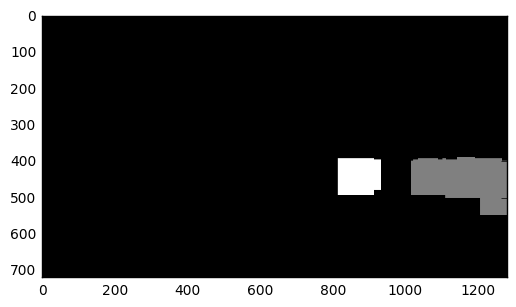

In [98]:
plt.imshow(lab[0],cmap='gray')